# Image Stitching for Panoramic Views

## 01. The mountain top
Imagine you have been climbing a mountain for hours. It is hot, you are sweating and finally you get to the top. A beautiful view opens up infront of your eyes and you bask in the glory of mother nature. A thought pops into your head. I want to save this memory. You pull out your phone, set the panoramic setting and just simply slide across and capture the whole view. Pretty easy and straighforward. But have you ever thought of how this technology works? Lets dive into it an see.

## 02. What is image stitching?

Lets define the problem. Modern cameras/lenses have a set field/angle of view and aspect ratio that limit how much of the world they can see.

[**Field of view**](https://www.digitalcameraworld.com/tutorials/photography-cheat-sheet-what-is-field-of-view-fov) - is simply the observable area that you can see either through your eyes or an optical device, such as a camera lens or telescope.

**Angle of View** - is used to illustrate a lens and sensor combination's angular coverage, independently of what's being photographed.

*There is a difference between Field of view and Angle of view but you can read more in the link above.

<img src="Project images/Example images/field_of_view.jpg" alt = "field_of_view" width="800"/>
<img src="Project images/Example images/aspect_ratios.jpg" alt = "aspect_ration" width="800"/>

Most people have seem fish eye 180* view that looks very distorted and even 360* degree from GoPros (called Photo spheres, because they can be mapped to a sphere and explored). The bigger the field of view the more it captures.

If you want to make a panoramic view you have to swap your camera lense with a wider field of view and take a picture. That is a lot of work and carrying of equipment. 

Do not worry. Image stitching to the rescue.

What if you you don't have to swap your lense and just carry a single one. Take a few pictures that slightly overlap and then do the stitching into a panoramic view with software. Sounds great. Lets do a visual since it is the best example when we talk about Computer vision (CV):

### You have this:
<div>
<img src="Project images/Example images/definition_building_left.jpg" alt = "left_building" width="400"/><img src="Project images/Example images/definition_building_right.jpg" alt = "right_building" width="400">
</div>

### You want this:
<img src="Project images/Example images/definition_building_panorama.jpg" alt = "panorama" width="800"/>

Pretty simple and easy. With complete solutions (like phone panoramic view or other sotfwares) you can easily achieve a pretty seamless stitching process)

There are a lot of challenges that we have to overcome so lets start. We will use the bottom up approach.

Lets start with the simplest, ugliest implementation and work out way up to just using OpenCV's Stitcher class that does it "in a single line of code".

## The steps of Image Stitching

What are the things we have to do to perform this miracle? The general steps are the following:
1. Detect keypoints and descriptors for both images
- Use some kind of feature detection(a signature of the feature) algorithm to find these
    - SIFT
    - ORB
    - SURF
    - etc.
- Visualiza the features and their orientation to gain a better understanding (not necessary)
2. Match the feature's descriptors
  - Use BruteForce matcher match the features in both images to understand where they overlap
  - Compute the Homography(Matrix Transformation of putting the 2nd image on the plane of the 1st image) and apply RANSAC so we can get an inlier mask to filter out the outliers and visualize only the matched features
  - Visualize only the matched features and their orientation to gain a better understanding (not necessary)
4. Warp the 2nd image on top of the 1st image
5. Blend the two images together for better visual effect
6. Profit?


### Setup

We will be working with 2 images:
- image1.jpg - Has to be the left image
- image2.jpg - Has to be the right image

I didn't extend it to work perfectly to be order invariant so make sure you name them correctly.

Original naming. I know! \
Feel free to put in your own photos just capture 2 images that slightly overlap and put them in the folder: **./Project images/Working images**\
Just edit the variables in the Setup section below


In [92]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

# Setup your images here
LEFT_IMAGE_NAME = 'image1.jpg'
RIGHT_IMAGE_NAME = 'image2.jpg'

# Constants
IMAGE_PATH = 'Project images/Working images/'
LEFT_IMAGE_PATH = IMAGE_PATH + LEFT_IMAGE_NAME
RIGHT_IMAGE_PATH = IMAGE_PATH + RIGHT_IMAGE_NAME

# Visualizations
CIRCLE_COLOR = (255, 0, 0)
LINE_COLOR = (255, 255, 255)
FIGSIZE_MATCHES = (32, 16)

def load_and_prepare_images(path1, path2):
    img1 = cv2.imread(path1)
    img2 = cv2.imread(path2)
    
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # We need the original img for visualization and the grayscale to eliminate the variable of color so we can focus on brightness.
    return img1, img2, gray1, gray2

### 1. Detect keypoints and descriptors

Keypoints? Descriptors? What the hell is that? Lets start with:

#### What is a feature?
- **Feature in Data Science** - features are individual, measurable properties or characteristics within a dataset that are used to train machine learning models. They can be numerical, categorical, text-based, or time-based. Simplifed - the column thingies of the processed dataset.

Then what is a feature when we talk about Computer Vision? (The above explanation does kind of still fit in CV)

- [**Feature in Computer Vision**](https://en.wikipedia.org/wiki/Feature_(computer_vision)) - a feature is a piece of information about the content of an image; typically about whether a certain region of the image has certain properties. Features may be specific structures in the image such as points, edges or objects.

[OpenCV gives us a more philosophical definition](https://docs.opencv.org/4.x/df/d54/tutorial_py_features_meaning.html) - we are looking for specific patterns or specific features which are unique, can be easily tracked and can be easily compared. If we go for a definition of such a feature, we may find it difficult to express it in words, but we know what they are. If someone asks you to point out one good feature which can be compared across several images, you can point out one. That is why even small children can simply play these games. We search for these features in an image, find them, look for the same features in other images and align them. That's it. (In jigsaw puzzle, we look more into continuity of different images). **All these abilities are present in us inherently.**

#### Why bother with these Features in the first place? 
We can use feature detction (we will look at such algorithms in a bit) to find them and try to match the features of 1 image to the features of another image and use them as keypoints/anchor points to know where they "intersect"/overlap.

Most used algorithms for Feature Detection in Computer Vision: 
- SIFT (Scale-Invariant Feature Transform) Patented
- ORB (Oriented FAST and Rotated BRIEF) Free to use from OpenCV
- SURF (Speeded-Up Robust Features) Patented

*There are other feature detection algorithms like AKAZE, BRISK, and FREAK that offer different trade-offs in terms of speed and robustness. 

#### What are Interesting Points?

Think of them as features. They have to:
- have rich image content (brightness variation, color variation etc.) within the local window (small area around, no exactly a single point/pixel)
- have well-defined representation (signature) for matchin/comparing with other points
- have a well-defined position in the image
- be invariant to image roation and scaling
- be insensitive to lighting changes

Examples of Interesting Points:
- Lines,Edges and Corners are not Interesting Points (not unique and position isn't concrete)
- Blobs are Interesting Points
    - <img src="Project images/Example images/blobs.jpg" alt = "blob" width="400">
    - We can see they fit the criteria for an Interesting Point very well.
    - The feature detection algorithms use exactly this. Blobs.

#### How are blobs useful?

They are called blobs in SIFT, and patches in ORB.

We need to determine their:
- Location
- Size
- Orientation
- Formulate a description/signature/footprint independent of size and orientation so we can match it with other blobs

This exactly what ORB, SIFT and these algorithms do. They provide us with ```kp1, des1 = orb.detectAndCompute(gray1, None)``` tuple 

#### Demo

Lets take a look at the code below. 

We will detect the Blobs/Interesting Points/Features that the algo ORB will generate so we can gain a better grasp of the whole concept.

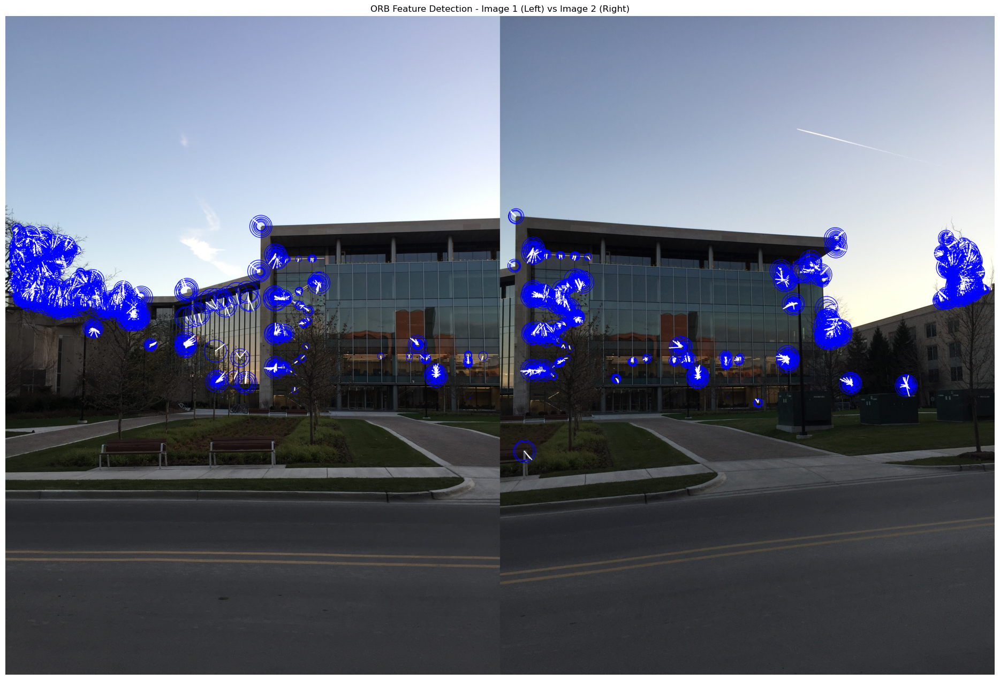

In [93]:
img1, img2, gray1, gray2 = load_and_prepare_images(LEFT_IMAGE_PATH, RIGHT_IMAGE_PATH)

orb = cv2.ORB_create(2000)

# Detect the Features/Blobs
kp1, des1 = orb.detectAndCompute(gray1, None)
kp2, des2 = orb.detectAndCompute(gray2, None)

def draw_keypoints_with_orientation(image, keypoints):
    image_out = image.copy()
    for kp in keypoints:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        angle_rad = np.deg2rad(kp.angle)
        length = int(kp.size / 2)
        x2 = int(x + length * np.cos(angle_rad))
        y2 = int(y + length * np.sin(angle_rad))
        cv2.circle(image_out, (x, y), int(kp.size / 2), CIRCLE_COLOR, 2)
        cv2.line(image_out, (x, y), (x2, y2), LINE_COLOR, 3)
    return image_out

output_image1 = draw_keypoints_with_orientation(img1, kp1)
output_image2 = draw_keypoints_with_orientation(img2, kp2)
combined = np.hstack((output_image1, output_image2))
plt.figure(figsize=FIGSIZE_MATCHES)
plt.imshow(cv2.cvtColor(combined, cv2.COLOR_BGR2RGB))
plt.title('ORB Feature Detection - Image 1 (Left) vs Image 2 (Right)')
plt.axis('off')
plt.show()

### 2. Match the feature's descriptors
Ok we have the features of both images and now what? Well, we have to match them.

When you run:

```python
kp, des = orb.detectAndCompute(image, None)
```
You get:

- `kp`: a list of keypoints, each with attributes like location, scale, and .angle (orientation)

- `des`: a 256-bit binary descriptor for each keypoint

But here’s the trick:

> **The orientation is not part of the descriptor, but it's essential to make the descriptor rotation invariant.**

Next lets first look into the orientation mechanism.

#### Step 1. Orientation Construction (FAST)

##### What is pixel intesity?
Pixel intensity refers to the numerical value representing the brightness or color information of a single pixel in an image. In grayscale images, intensity typically ranges from 0 (black) to 255 (white) for an 8-bit system. For color images, each pixel has intensity values for red, green, and blue (RGB) channels, each also ranging from 0 to 255. 

Basically the brightness ranging from [0;255]

##### [What is in image moment?](https://en.wikipedia.org/wiki/Image_moment)
An image moment is a weighted average of pixel intensities used to capture various shape characteristics of a region — such as centroid, orientation, and spread.

In ORB (and SIFT), moments are used to find the dominant orientation of the patch around a keypoint to achieve rotation invariance.

Simply put they are used to find the direction of the blob/patch.

##### Common 2D Moments:
For a grayscale image $I(x, y)$ - intensity, the raw moment of order (p, q) is:
$$ m_{pq} = \sum_{x}^{} \sum_{y}^{} x^py^q.I(x,y)$$

* p and q are the orders of the moment in the x and y directions, respectively

What p and q mean:
- `p = 0, q = 0 ` → $m_{00}$ : total intensity (like sum of all pixel values)
- `p = 1, q = 0 ` → $m_{10}$ : tells how intensity is distributed horizontally
- `p = 0, q = 1 ` → $m_{01}$ : tells how intensity is distributed vertically
- `p = 1, q = 1 ` → $m_{11}$ : used for more advanced shape descriptions (like orientation spread)

- `p = 2, q = 0 ` → higher-order moments capture shape features

In ORB we specifically use:
- $m_{10} = \sum_{x}^{} \sum_{y}^{}  x.I(x,y)$
- $m_{01} = \sum_{x}^{} \sum_{y}^{}  y.I(x,y)$

To compute the dominant direction of intensity in a keypoint’s patch:
$$ \theta = arctan\biggl(\frac{m_{01}}{m_{10}}\biggr) $$

That orientation angle $\theta$ is used to rotate the binary descriptor sampling pattern, making the descriptor rotation invariant.

---

Now... I know... What the hell did you just read. Don't worry I was the exact same way when I read it the first time. Don't worry it is hard only the first time ;)

Let me clarify some things. 
1. ORB uses the FAST algo to detect corners quickly (it tends to detect many points), then ORB ranks them using the Harris corner measure to keep only the strongest, most stable ones.
2. Now that we have some interesting points we start the bulk of the work.
   - For each point ORB extracts a patch. Think of it like a 31x31 square/area of pixels, where the point is at (0,0) LOCAL COORDINATED - very important (I thought of global image coordinated when I was reading about this the first time). This means $x \in [-15;15]$ and $y \in [-15;15]$
   - Then for this patch we have to compute the image moments ($m_{01}$ and $m_{01}$ or in **what direction is the brightness**.
        -  It does a double loop of all X and Y values from -15 to 15 and it summs the product of the pixel brightness and the distance from the center, but only horizontally or veritcally.
        - $m_{10} = \sum_{x}^{(-15;15)} \sum_{y}^{(-15;15)}  x.I(x,y)$
        - $m_{01} = \sum_{x}^{(-15;15)} \sum_{y}^{(-15;15)}  y.I(x,y)$  
   - Then it calculates the dominant orientation
       - $ \theta = arctan\biggl(\frac{m_{01}}{m_{10}}\biggr) $
       - So why the hell is $\theta = arctan()$? Why this function?
           - x-axis: m10 -> horizontal moment
           - y-axis: m01 -> vertical moment
           - It give you a 2D vector: $\hat{v} = (m_{10}, m_{01}) $
           - So the angle $\theta$ of the vector (its direction) is $\theta = $ angle between  $\hat{v} $ and X-axis
           - In a right triangle the tan() is exactly that: $tan(\theta) = \frac{opposite}{adjacent} = \frac{y}{x}$
           - But we need the angle and we have the sides, so we do the inverse function: $ \theta = arctan\biggl(\frac{m_{01}}{m_{10}}\biggr) $
           - <img src="Project images/Example images/Tangent-Ratio.jpg" alt = "blob" width="300">



Lets look at an example to make it even more clear:
For the sake of simplicity and lazyness lets make the patch 5x5 not 31x31.

##### Example: 5×5 Patch with Brighter Right Side

Assume a keypoint-centered coordinate system with $ x, y \in [-2, 2] $, and intensity values defined as follows:

| $ y \backslash x $ | -2 | -1 |  0 |  1 |  2 |
|----------------------|----|----|----|----|----|
| 2                    |  0 |  0 |  0 |  1 |  1 |
| 1                    |  0 |  0 |  0 |  1 |  1 |
| 0                    |  0 |  0 |  0 |  1 |  1 |
| -1                   |  0 |  0 |  0 |  1 |  1 |
| -2                   |  0 |  0 |  0 |  0 |  1 |

This represents a patch where only the right two columns (x = 1 and x = 2) are bright (intensity = 1), and the rest are dark (intensity = 0). We will use 0 and 1 for simplicity's sake.

##### Moment Calculations

**Definition:**

$$
m_{pq} = \sum_{x} \sum_{y} x^p y^q \cdot I(x, y)
$$

##### Step 1: Compute $ m_{10} $ (horizontal moment)

Only pixels with intensity 1 contribute. Count of bright pixels per x:

- \( x = 1 \): 4 pixels (y = -1 to 2)
- \( x = 2 \): 5 pixels (y = -2 to 2)

$$
m_{10} = 1 \cdot 4 + 2 \cdot 5 = \boxed{14}
$$

##### Step 2: Compute $ m_{01} $ (vertical moment)

Let’s list bright pixels and their y-coordinates:

- At \( x = 1 \): \( y = -1, 0, 1, 2 \) → sum of y = 2
- At \( x = 2 \): \( y = -2, -1, 0, 1, 2 \) → sum of y = 0

Total:

$$
m_{01} = \sum y \cdot I(x, y) = 2 + 0 = \boxed{2}
$$

---

##### Step 3: Compute Orientation

$$
\theta = \arctan\left(\frac{m_{01}}{m_{10}}\right) = \arctan\left(\frac{2}{14}\right) \approx 0.1419 \text{ radians} \approx \boxed{8.1^\circ}
$$

##### Interpretation

| Moment     | Value  | Meaning                            |
|------------|--------|------------------------------------|
| \( m_{10} \) | 15     | Strong horizontal (rightward) bias |
| \( m_{01} \) | -2     | Slight upward tilt                |
| \( \theta \) | -7.5°  | Dominant direction ≈ right & up   |



#### Step 2. Descriptor Construction (Rotated BRIEF)

Now that we have it we can use it to find the desciptors for the patch.

> **Definition**: An ORB descriptor is a binary string (usually 256 bits long) that encodes the local image structure around a keypoint. It’s built using a clever, fast sampling method - not histograms like in SIFT.

Big Idea:
> Let’s describe a keypoint by comparing the brightness of pairs of pixels around it. If the first is brighter than the second, write 1, else write 0. Do this 256 times.

This gives a compact fingerprint of the texture near the keypoint that’s:

- Rotation invariant (thanks to orientation)
- Scale robust
- Fast to compute and match (via Hamming distance)

ORB rotates the sampling pattern (the 256 pixel pairs) according to the keypoint’s orientation, so that binary comparisons always follow the same structure — even if the image is rotated.

So:
- We rotate the pattern before applying the tests.
- This makes the descriptor rotation invariant.


#### BruteForce matcher

#####  Why use Brute-Force?
- Simple
- Good for small or medium numbers of descriptors
- Works well in controlled cases or prototypes

#### Compute the Homography and apply RANSAC

#### Visualize (not necessary)

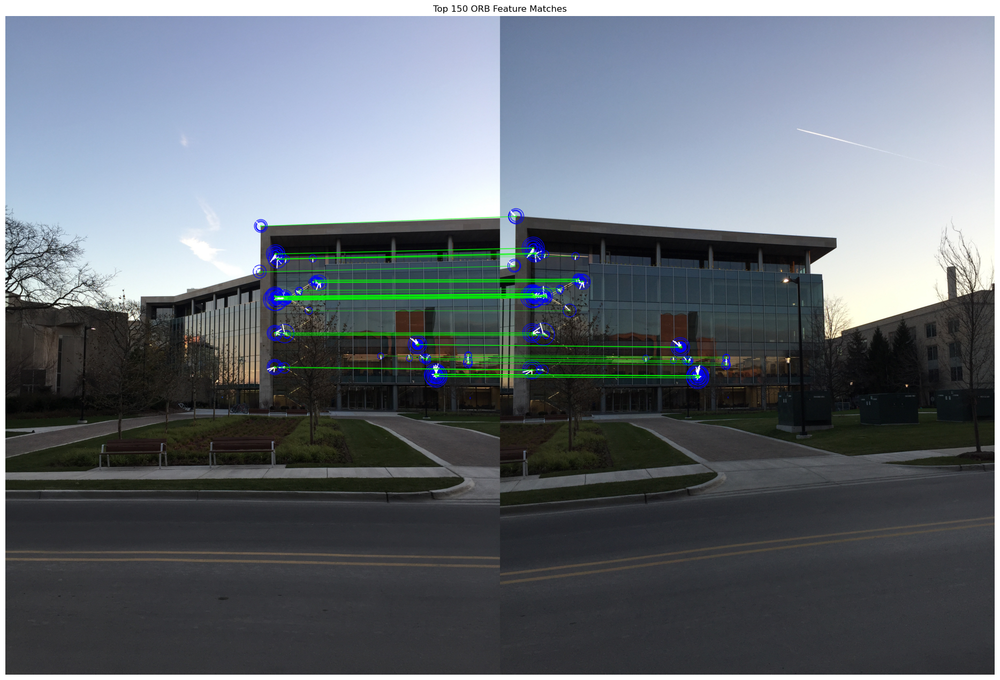

In [94]:
def draw_matches_side_by_side(img1, kp1, img2, kp2, des1, des2, max_matches=50):
    def draw_keypoints_with_orientation(image, keypoints, matches, is_query=True):
        image_out = image.copy()
        matched_idx = set([m.queryIdx if is_query else m.trainIdx for m in matches])
        for i, kp in enumerate(keypoints):
            if i not in matched_idx:
                continue
            x, y = int(kp.pt[0]), int(kp.pt[1])
            angle_rad = np.deg2rad(kp.angle)
            length = int(kp.size / 2)
            x2 = int(x + length * np.cos(angle_rad))
            y2 = int(y + length * np.sin(angle_rad))
            cv2.circle(image_out, (x, y), int(kp.size / 2), CIRCLE_COLOR, 2)
            cv2.line(image_out, (x, y), (x2, y2), LINE_COLOR, 3)
        return image_out

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches_all = bf.match(des1, des2)
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches_all]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches_all]).reshape(-1, 1, 2)
    _, inlier_mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    inlier_mask = inlier_mask.ravel().astype(bool)
    matches = [m for i, m in enumerate(matches_all) if inlier_mask[i]]
    matches = sorted(matches, key=lambda x: x.distance)[:max_matches]

    img1_oriented = draw_keypoints_with_orientation(img1, kp1, matches, is_query=True)
    img2_oriented = draw_keypoints_with_orientation(img2, kp2, matches, is_query=False)

    match_img = cv2.drawMatches(img1_oriented, kp1, img2_oriented, kp2, matches, None,
                                matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=2)
    plt.figure(figsize=FIGSIZE_MATCHES)
    plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Top {max_matches} ORB Feature Matches')
    plt.axis('off')
    plt.show()

draw_matches_side_by_side(img1, kp1, img2, kp2, des1, des2,150)

## Image Stitching Demo

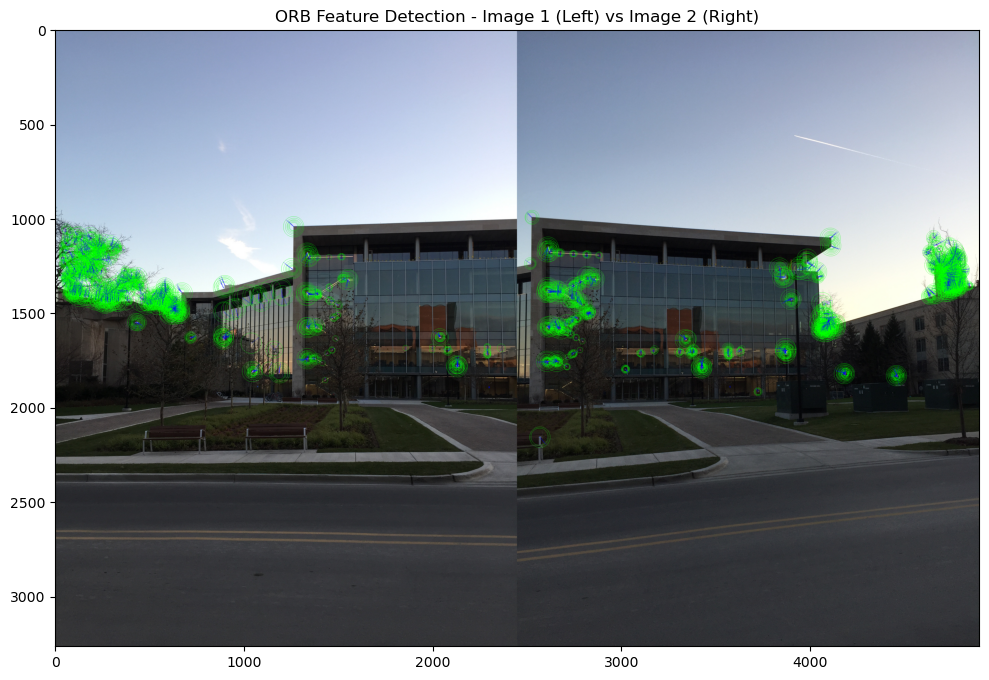

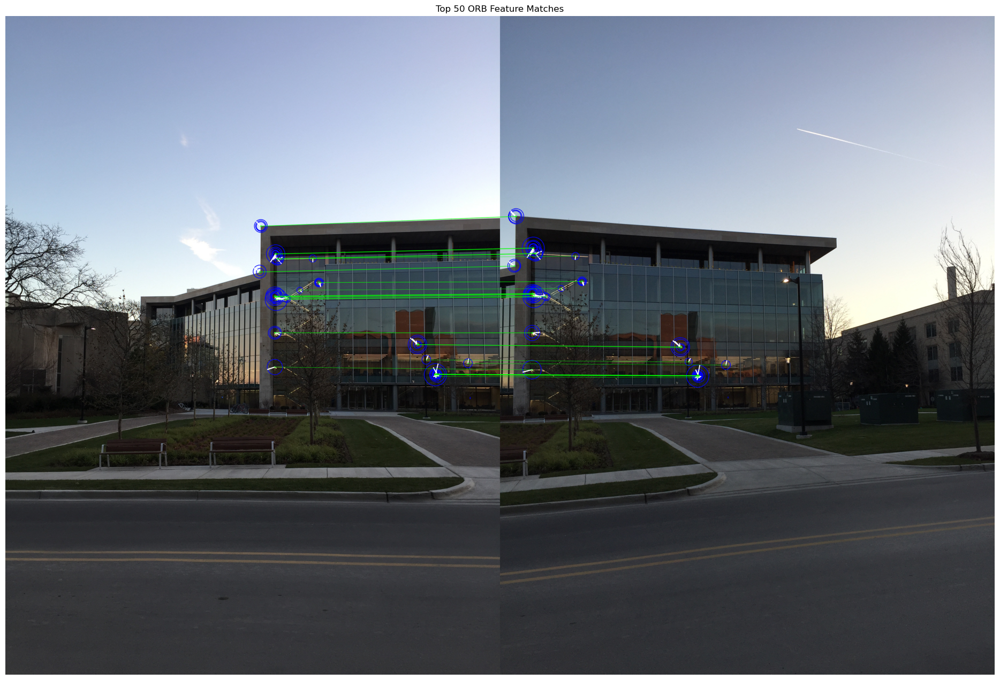

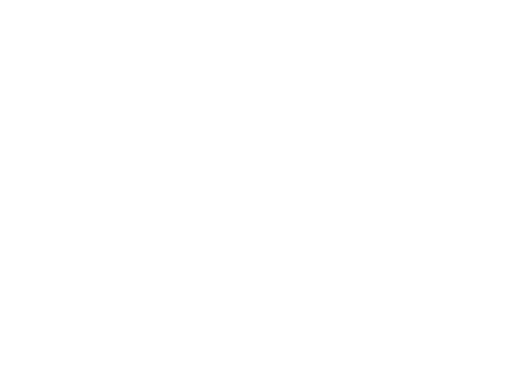

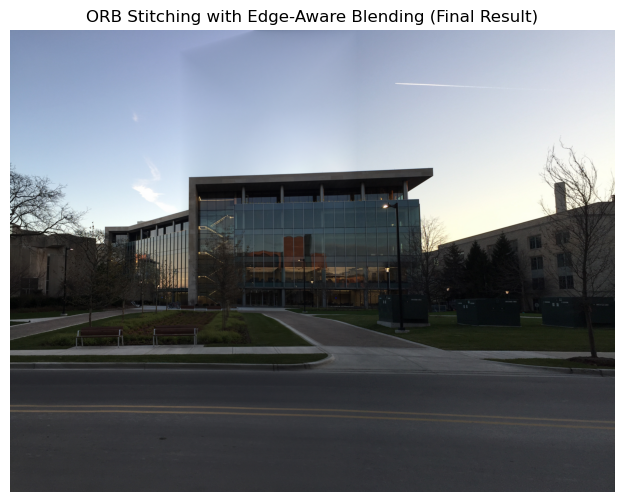

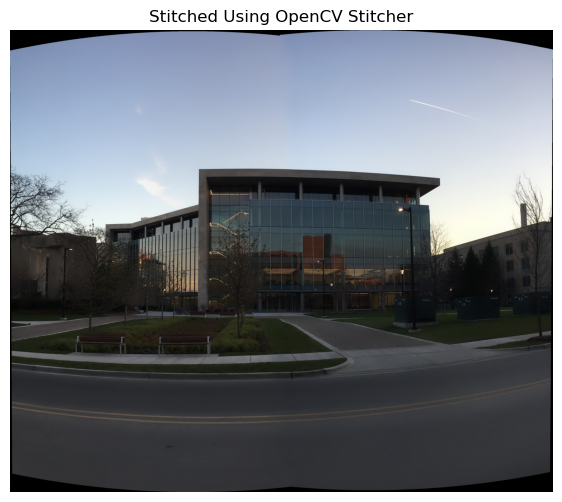

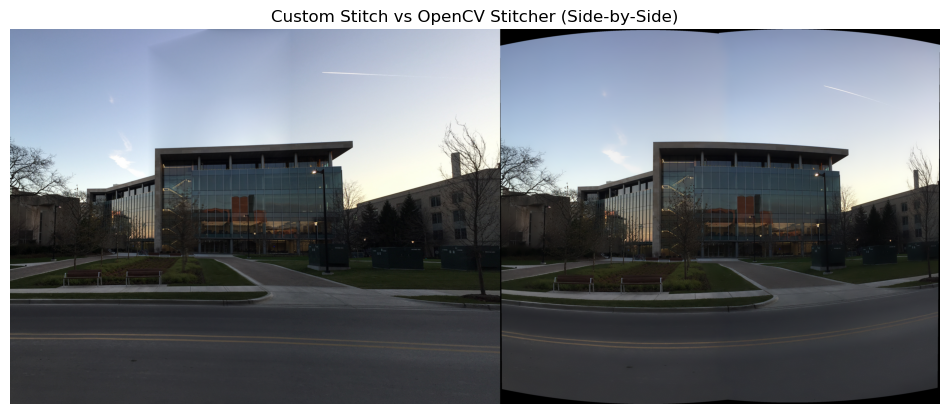

In [95]:
def load_and_prepare_images(path1, path2):
    img1 = cv2.imread('Project images/Working images/image1.jpg')
    img2 = cv2.imread('Project images/Working images/image2.jpg')
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    return img1, img2, gray1, gray2

def compute_homography(gray1, gray2):
    orb = cv2.ORB_create(2000)
    kp1, des1 = orb.detectAndCompute(gray1, None)
    kp2, des2 = orb.detectAndCompute(gray2, None)
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = sorted(bf.match(des1, des2), key=lambda x: x.distance)
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    H, _ = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
    return H

def warp_images(img1, img2, H):
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    corners_img2 = np.float32([[0,0], [0,h2], [w2,h2], [w2,0]]).reshape(-1, 2)
    warped_corners = cv2.perspectiveTransform(corners_img2.reshape(-1, 1, 2), H).reshape(-1, 2)
    all_corners = np.concatenate((warped_corners, np.float32([[0,0], [0,h1], [w1,h1], [w1,0]])), axis=0)
    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)
    translate = [-xmin, -ymin]
    H_translate = np.array([[1, 0, translate[0]], [0, 1, translate[1]], [0, 0, 1]])
    warped_img2 = cv2.warpPerspective(img2, H_translate @ H, (xmax - xmin, ymax - ymin))
    panorama = np.zeros((ymax - ymin, xmax - xmin, 3), dtype=np.uint8)
    panorama[translate[1]:translate[1]+h1, translate[0]:translate[0]+w1] = img1
    return warped_img2, panorama, warped_corners, translate, h1

def edge_aware_blend(panorama, warped_img2):
    mask1 = (cv2.cvtColor(panorama, cv2.COLOR_BGR2GRAY) > 0).astype(np.uint8)
    mask2 = (cv2.cvtColor(warped_img2, cv2.COLOR_BGR2GRAY) > 0).astype(np.uint8)
    dist1 = distance_transform_edt(mask1)
    dist2 = distance_transform_edt(mask2)
    total = dist1 + dist2 + 1e-6
    weight1 = (dist1 / total)[..., None]
    weight2 = (dist2 / total)[..., None]
    blended = (panorama.astype(np.float32) * weight1 + warped_img2.astype(np.float32) * weight2).astype(np.uint8)
    return blended

def crop_stitched_image(blended, warped_corners, translate, h1):
    x1, y1 = warped_corners[3][0] + translate[0], warped_corners[3][1] + translate[1]  # bottom-right
    x2, y2 = warped_corners[2][0] + translate[0], warped_corners[2][1] + translate[1]  # top-right
    def intersect_x_at_y(y):
        if abs(y2 - y1) < 1e-6:
            return int(min(x1, x2))
        return int(x1 + (y - y1) * (x2 - x1) / (y2 - y1))
    left_x = 0
    top_y = translate[1]
    bottom_y = top_y + h1
    right_x = min(intersect_x_at_y(top_y), intersect_x_at_y(bottom_y))
    right_x = max(right_x, left_x + 1)
    return blended[top_y:bottom_y, left_x:right_x]

def display_image(image, title="Stitched Image"):
    plt.figure(figsize=(12, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

# --- ORB Keypoints Visualization ---
def draw_matches_side_by_side(img1, kp1, img2, kp2, des1, des2, max_matches=50):
    def draw_keypoints_with_orientation(image, keypoints, matches, is_query=True):
        image_out = image.copy()
        matched_idx = set([m.queryIdx if is_query else m.trainIdx for m in matches])
        for i, kp in enumerate(keypoints):
            if i not in matched_idx:
                continue
            x, y = int(kp.pt[0]), int(kp.pt[1])
            angle_rad = np.deg2rad(kp.angle)
            length = int(kp.size / 2)
            x2 = int(x + length * np.cos(angle_rad))
            y2 = int(y + length * np.sin(angle_rad))
            cv2.circle(image_out, (x, y), int(kp.size / 2), CIRCLE_COLOR, 2)
            cv2.line(image_out, (x, y), (x2, y2), LINE_COLOR, 3)
        return image_out

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches_all = bf.match(des1, des2)
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches_all]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches_all]).reshape(-1, 1, 2)
    _, inlier_mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    inlier_mask = inlier_mask.ravel().astype(bool)
    matches = [m for i, m in enumerate(matches_all) if inlier_mask[i]]
    matches = sorted(matches, key=lambda x: x.distance)[:max_matches]

    img1_oriented = draw_keypoints_with_orientation(img1, kp1, matches, is_query=True)
    img2_oriented = draw_keypoints_with_orientation(img2, kp2, matches, is_query=False)

    match_img = cv2.drawMatches(img1_oriented, kp1, img2_oriented, kp2, matches, None,
                                matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=2)
    plt.figure(figsize=FIGSIZE_MATCHES)
    plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Top {max_matches} ORB Feature Matches')
    plt.axis('off')
    plt.show()


img1, img2, gray1, gray2 = load_and_prepare_images('Project images/Working images/image1.jpg', 'Project images/Working images/image2.jpg')

orb = cv2.ORB_create(2000)
kp1, des1 = orb.detectAndCompute(gray1, None)
kp2, des2 = orb.detectAndCompute(gray2, None)

def draw_keypoints_with_orientation(image, keypoints):
    image_out = image.copy()
    for kp in keypoints:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        angle_rad = np.deg2rad(kp.angle)
        length = int(kp.size / 2)
        x2 = int(x + length * np.cos(angle_rad))
        y2 = int(y + length * np.sin(angle_rad))
        cv2.circle(image_out, (x, y), int(kp.size / 2), (0, 255, 0), 1)
        cv2.line(image_out, (x, y), (x2, y2), (255, 0, 0), 1)
    return image_out

output_image1 = draw_keypoints_with_orientation(img1, kp1)
output_image2 = draw_keypoints_with_orientation(img2, kp2)
combined = np.hstack((output_image1, output_image2))
plt.figure(figsize=(16, 8))
plt.imshow(cv2.cvtColor(combined, cv2.COLOR_BGR2RGB))
plt.title('ORB Feature Detection - Image 1 (Left) vs Image 2 (Right)')
draw_matches_side_by_side(img1, kp1, img2, kp2, des1, des2)
plt.axis('off')
plt.show()

# --- Full Pipeline Execution ---
img1, img2, gray1, gray2 = load_and_prepare_images('', '')
H = compute_homography(gray1, gray2)
warped_img2, panorama, warped_corners, translate, h1 = warp_images(img1, img2, H)
blended = edge_aware_blend(panorama, warped_img2)
cropped = crop_stitched_image(blended, warped_corners, translate, h1)
display_image(cropped, "ORB Stitching with Edge-Aware Blending (Final Result)")

# --- Comparison with OpenCV Stitcher ---
stitcher = cv2.Stitcher_create()
status, stitched = stitcher.stitch([img1, img2])
if status == cv2.Stitcher_OK:
    display_image(stitched, "Stitched Using OpenCV Stitcher")

    # Resize both results to same height for visual comparison
    height = min(cropped.shape[0], stitched.shape[0])
    cropped_resized = cv2.resize(cropped, (int(cropped.shape[1] * height / cropped.shape[0]), height))
    stitched_resized = cv2.resize(stitched, (int(stitched.shape[1] * height / stitched.shape[0]), height))

    comparison = np.hstack((cropped_resized, stitched_resized))
    display_image(comparison, "Custom Stitch vs OpenCV Stitcher (Side-by-Side)")
else:
    print("OpenCV Stitcher failed with status:", status)

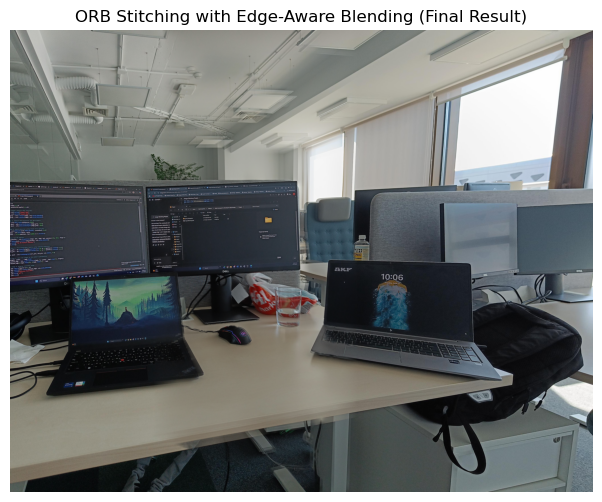

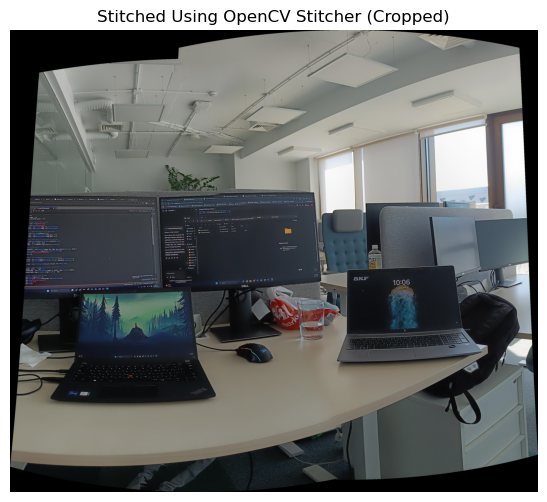

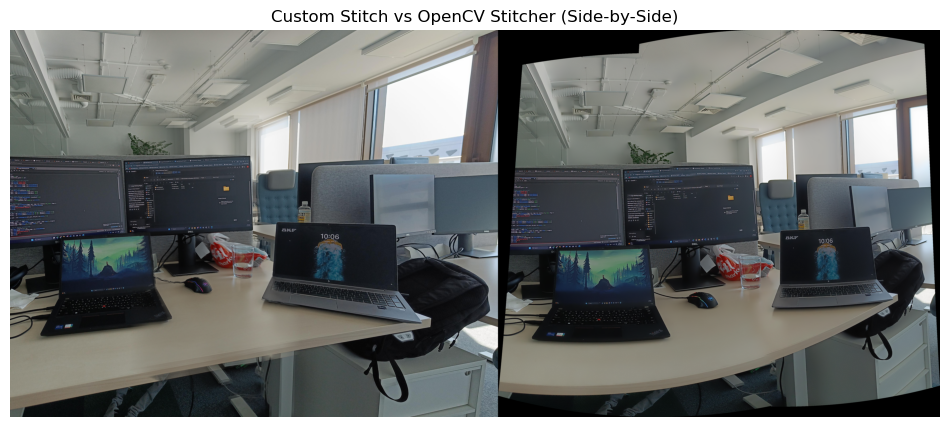

In [96]:
# ORB-Based Image Stitching with Edge-Aware Blending (Distance-Based, No Pyramids)

import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def load_and_prepare_images(path1, path2):
    img1 = cv2.imread(path1)
    img2 = cv2.imread(path2)
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    return img1, img2, gray1, gray2

def compute_homography(gray1, gray2):
    orb = cv2.ORB_create(2000)
    kp1, des1 = orb.detectAndCompute(gray1, None)
    kp2, des2 = orb.detectAndCompute(gray2, None)
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = sorted(bf.match(des1, des2), key=lambda x: x.distance)
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    H, _ = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
    return H

def warp_images(img1, img2, H):
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    corners_img2 = np.float32([[0,0], [0,h2], [w2,h2], [w2,0]]).reshape(-1, 2)
    warped_corners = cv2.perspectiveTransform(corners_img2.reshape(-1, 1, 2), H).reshape(-1, 2)
    all_corners = np.concatenate((warped_corners, np.float32([[0,0], [0,h1], [w1,h1], [w1,0]])), axis=0)
    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)
    translate = [-xmin, -ymin]
    H_translate = np.array([[1, 0, translate[0]], [0, 1, translate[1]], [0, 0, 1]])
    warped_img2 = cv2.warpPerspective(img2, H_translate @ H, (xmax - xmin, ymax - ymin))
    panorama = np.zeros((ymax - ymin, xmax - xmin, 3), dtype=np.uint8)
    panorama[translate[1]:translate[1]+h1, translate[0]:translate[0]+w1] = img1
    return warped_img2, panorama, warped_corners, translate, h1

def edge_aware_blend(panorama, warped_img2):
    mask1 = (cv2.cvtColor(panorama, cv2.COLOR_BGR2GRAY) > 0).astype(np.uint8)
    mask2 = (cv2.cvtColor(warped_img2, cv2.COLOR_BGR2GRAY) > 0).astype(np.uint8)
    dist1 = distance_transform_edt(mask1)
    dist2 = distance_transform_edt(mask2)
    total = dist1 + dist2 + 1e-6
    weight1 = (dist1 / total)[..., None]
    weight2 = (dist2 / total)[..., None]
    blended = (panorama.astype(np.float32) * weight1 + warped_img2.astype(np.float32) * weight2).astype(np.uint8)
    return blended

def crop_stitched_image(blended, warped_corners, translate, h1):
    x1, y1 = warped_corners[3][0] + translate[0], warped_corners[3][1] + translate[1]  # bottom-right
    x2, y2 = warped_corners[2][0] + translate[0], warped_corners[2][1] + translate[1]  # top-right
    def intersect_x_at_y(y):
        if abs(y2 - y1) < 1e-6:
            return int(min(x1, x2))
        return int(x1 + (y - y1) * (x2 - x1) / (y2 - y1))
    left_x = 0
    top_y = translate[1]
    bottom_y = top_y + h1
    right_x = min(intersect_x_at_y(top_y), intersect_x_at_y(bottom_y))
    right_x = max(right_x, left_x + 1)
    return blended[top_y:bottom_y, left_x:right_x]

def crop_black_borders(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        x, y, w, h = cv2.boundingRect(max(contours, key=cv2.contourArea))
        return image[y:y+h, x:x+w]
    return image

def display_image(image, title="Stitched Image"):
    plt.figure(figsize=(12, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

# --- Full Pipeline Execution ---
img1, img2, gray1, gray2 = load_and_prepare_images('Project images/Working images/image_desk1.jpg', 'Project images/Working images/image_desk2.jpg')
H = compute_homography(gray1, gray2)
warped_img2, panorama, warped_corners, translate, h1 = warp_images(img1, img2, H)
blended = edge_aware_blend(panorama, warped_img2)
cropped = crop_stitched_image(blended, warped_corners, translate, h1)
display_image(cropped, "ORB Stitching with Edge-Aware Blending (Final Result)")

# --- Comparison with OpenCV Stitcher ---
stitcher = cv2.Stitcher_create()
status, stitched = stitcher.stitch([img1, img2])
if status == cv2.Stitcher_OK:
    stitched_cropped = crop_black_borders(stitched)
    display_image(stitched_cropped, "Stitched Using OpenCV Stitcher (Cropped)")

    # Resize both results to same height for visual comparison
    height = min(cropped.shape[0], stitched_cropped.shape[0])
    cropped_resized = cv2.resize(cropped, (int(cropped.shape[1] * height / cropped.shape[0]), height))
    stitched_resized = cv2.resize(stitched_cropped, (int(stitched_cropped.shape[1] * height / stitched_cropped.shape[0]), height))

    comparison = np.hstack((cropped_resized, stitched_resized))
    display_image(comparison, "Custom Stitch vs OpenCV Stitcher (Side-by-Side)")
else:
    print("OpenCV Stitcher failed with status:", status)

ChatGPT test

## Resources

Resources:
- [Aspect Ratio](https://photographylife.com/aspect-ratio)
- [Field of View/Angle of View](https://www.digitalcameraworld.com/tutorials/photography-cheat-sheet-what-is-field-of-view-fov)
- [What is a Feature](https://docs.opencv.org/4.x/df/d54/tutorial_py_features_meaning.html)
- [Interesting Point](https://www.youtube.com/watch?v=wcqbiHonfbo)

Bibliograpy:
- [C. Harris and M. Stephens. A Combined Corner and Edge Detector. In C. J. Taylor, editors, Proceedings of the Alvey Vision Conference, pages 23.1-23.6. Alvey Vision Club, September 1988. doi:10.5244/C.2.23.](https://www.bmva-archive.org.uk/bmvc/1988/avc-88-023.pdf)
- [Lowe, David G.. “Distinctive Image Features from Scale-Invariant Keypoints.” International Journal of Computer Vision 60 (2004): 91-110.](https://cs.gmu.edu/~zduric/cs774/Papers/Lowe-Features-IJCV.pdf)